# Spotify Audio Features Exploratory Data Analysis

In [1]:
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib import rcParams
from matplotlib.patches import Rectangle
from scipy.stats import relfreq

warnings.filterwarnings('ignore')

rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = 'arial'

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

## Load data

In [2]:
df_spotify = pd.read_csv('../data/processed/spotify.csv')
df_spotify = df_spotify.drop(['billboard_df_index'], axis = 1)
df_spotify.sample(3)

,spotify_song,spotify_artist,duration_minutes,popularity,explicit,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
795,Mony Mony,Tommy James & The Shondells,2.902217,55.0,0.0,0.3220,0.592,0.834,0.000000,2.0,0.364,-11.565,1.0,0.0334,130.967,4.0,0.809
4923,Tonight Tonight,Hot Chelle Rae,3.341117,76.0,0.0,0.0764,0.686,0.783,0.000000,4.0,0.163,-4.977,1.0,0.1190,99.978,4.0,0.814
3886,Oops!...I Did It Again,Britney Spears,3.519333,79.0,0.0,0.3000,0.751,0.834,0.000018,1.0,0.355,-5.444,0.0,0.0437,95.053,4.0,0.894


## Univariate distributions

In [3]:
df_spotify.columns

Index(['spotify_song', 'spotify_artist', 'duration_minutes', 'popularity',
       'explicit', 'acousticness', 'danceability', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence'],
      dtype='object')

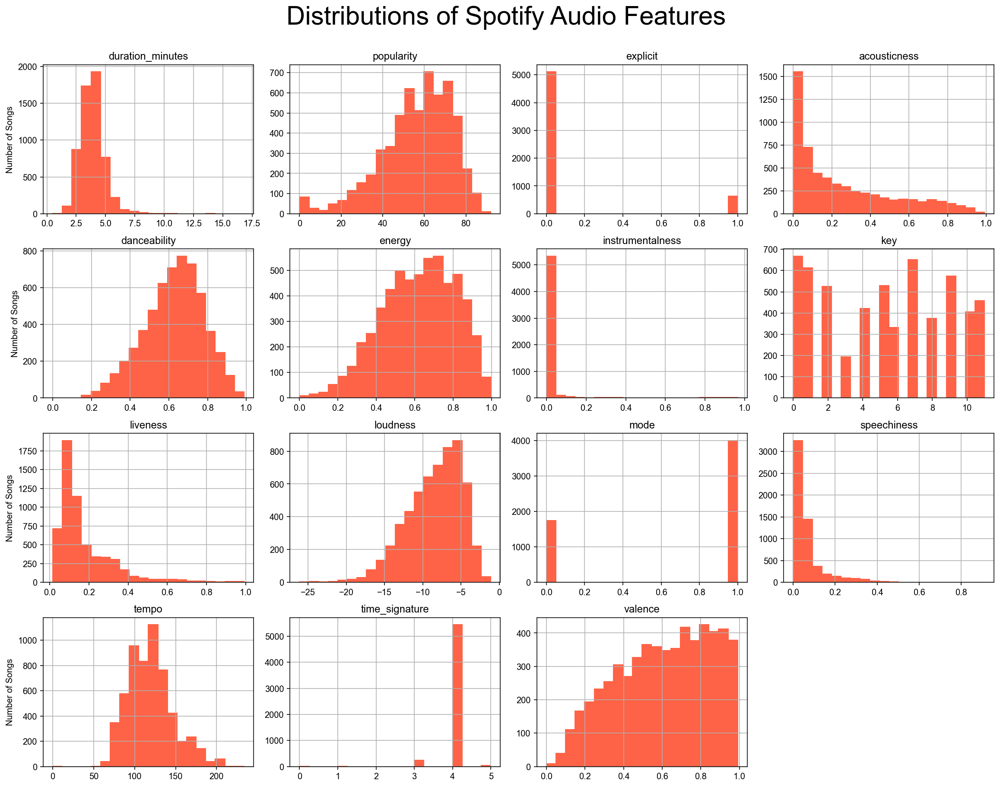

In [4]:
axes = df_spotify.hist(figsize=(16,12), bins=20, alpha=1,
                       facecolor='tomato', edgecolor='tomato');
axes = axes.ravel()
plt.tight_layout()

titles = df_spotify.columns[2:]

for i in range(len(axes)-1):
    axes[i].set_title(titles[i])
    if i % 4 == 0:
        axes[i].set_ylabel('Number of Songs')
plt.suptitle('Distributions of Spotify Audio Features', fontsize=30, y=1.05);

In [5]:
df_spotify[df_spotify['duration_minutes'] > 10]

,spotify_song,spotify_artist,duration_minutes,popularity,explicit,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
1336,The Story of Nanette: Nanette / Alabama Song /...,Bette Midler,14.033783,7.0,0.0,0.7660,0.418,0.423,0.000000,2.0,0.9730,-13.149,1.0,0.1640,112.789,4.0,0.317
1340,Masterpiece,The Temptations,13.840000,50.0,0.0,0.1530,0.789,0.392,0.476000,10.0,0.0299,-15.395,0.0,0.0345,119.000,4.0,0.895
1348,Also Sprach Zarathustra,Deodato,11.052217,13.0,0.0,0.4310,0.448,0.763,0.359000,0.0,0.2910,-11.657,1.0,0.0493,117.938,4.0,0.513
1435,Tubular Bells - Two Sides Excerpt,Mike Oldfield,13.479333,1.0,0.0,0.4900,0.283,0.201,0.002480,9.0,0.1300,-16.649,0.0,0.0322,149.531,4.0,0.149
1591,Love To Love You Baby,Donna Summer,16.808883,47.0,0.0,0.2920,0.622,0.425,0.000057,10.0,0.0498,-16.256,1.0,0.0520,96.168,4.0,0.417
1822,Don't Let Me Be Misunderstood,Santa Esmeralda,10.475783,60.0,0.0,0.0329,0.669,0.815,0.001050,9.0,0.0498,-8.998,0.0,0.0838,117.809,4.0,0.784
2595,A Love Bizarre,Sheila E.,12.300883,47.0,0.0,0.0217,0.768,0.612,0.023900,1.0,0.0513,-13.381,1.0,0.0454,113.798,4.0,0.878
3370,Bop Gun (One Nation) - Remastered,Ice Cube,11.086000,40.0,1.0,0.2570,0.845,0.663,0.000790,6.0,0.2430,-8.756,1.0,0.0508,103.053,4.0,0.752
5229,Not a Bad Thing,Justin Timberlake,11.474217,57.0,1.0,0.5270,0.308,0.563,0.000005,0.0,0.1340,-9.169,1.0,0.0719,85.901,4.0,0.109


## Correlation heatmap 

Text(0.4, 1, 'Correlation Matrix Heatmap')

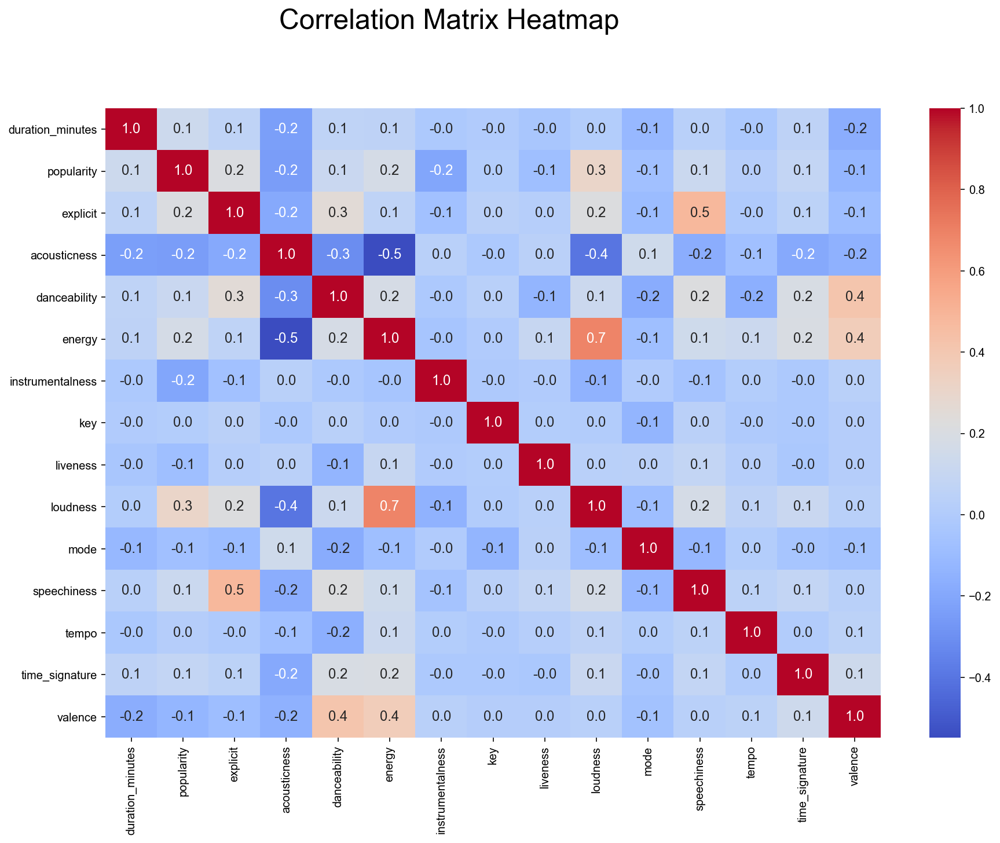

In [6]:
columns = df_spotify.columns[2:]
df_numeric = df_spotify[columns]

plt.figure(figsize=(15, 10))
sns.heatmap(df_numeric.corr(), cmap='coolwarm', annot=True, fmt=".1f", annot_kws={'size':12})
plt.suptitle('Correlation Matrix Heatmap', fontsize=24, x=0.4, y=1)

## Bivariate distributions

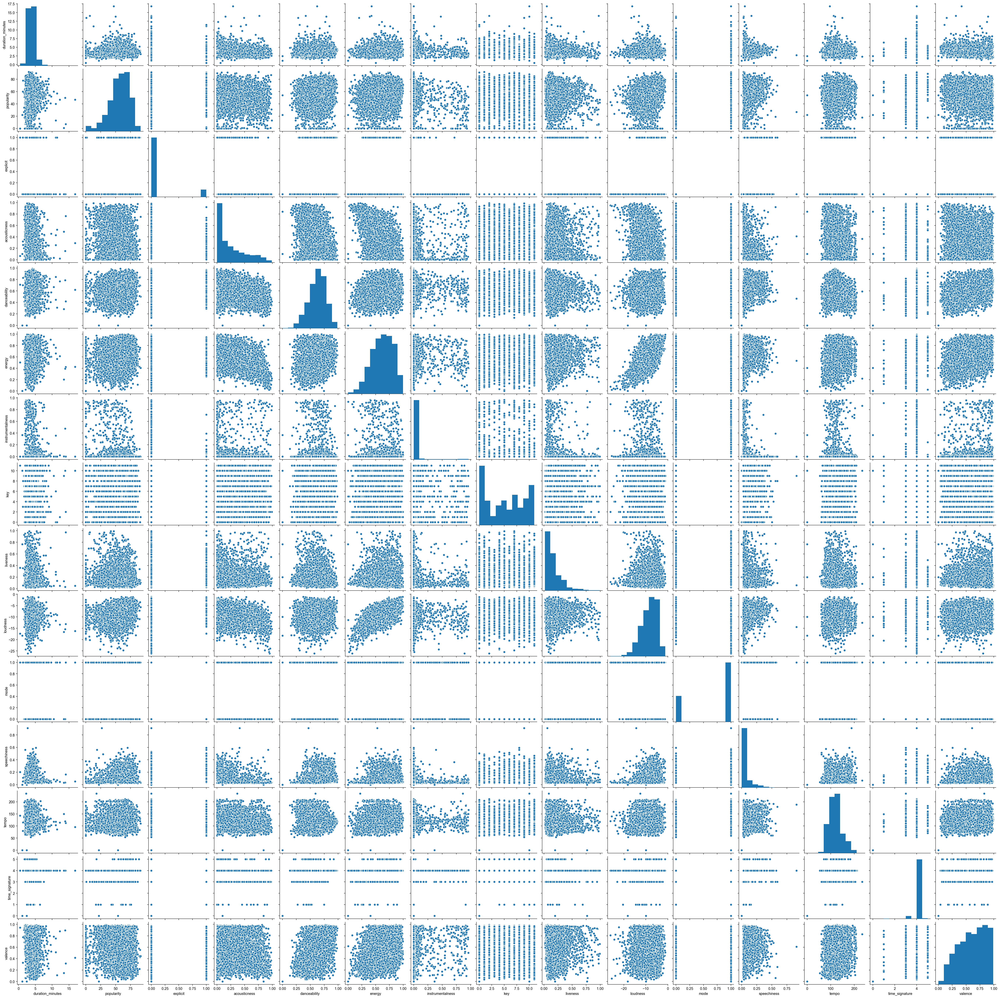

In [7]:
# Pairplot

sns.pairplot(df_numeric)

Text(0.5, 1.05, 'Closely Related Audio Features')

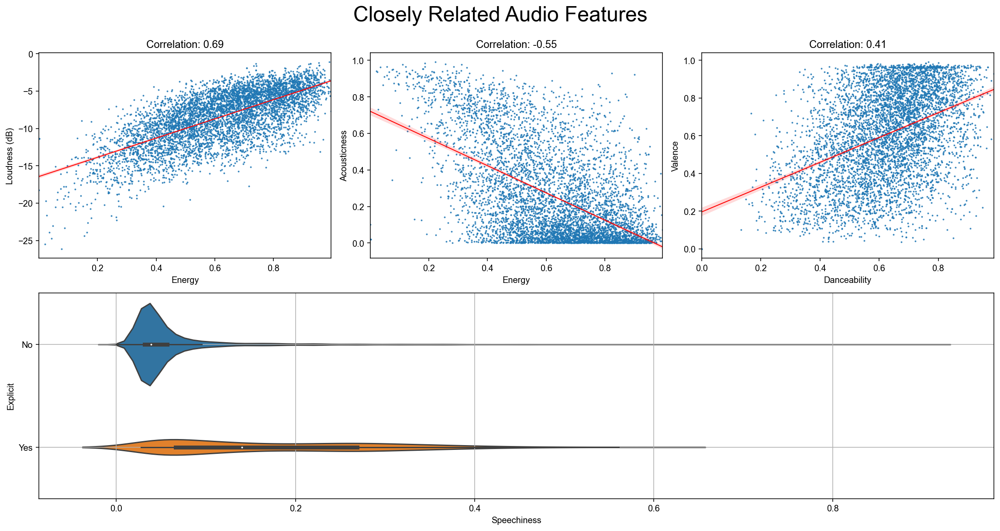

In [8]:
# generate subplot axes
axes = list()
plt.figure(figsize = (16,8))
grid_positions = [231, 232, 233, 212]
for position in grid_positions:
    axes.append(plt.subplot(position))
    
feature_pairs = [('energy', 'loudness'), ('energy', 'acousticness'),
                 ('danceability', 'valence')]

# generate upper scatter plots
for (x, y), ax in zip(feature_pairs, axes[:3]):
    r = np.corrcoef(df_spotify[x].dropna(), df_spotify[y].dropna())[0][1]
    sns.regplot(data=df_spotify, x=x, y=y, line_kws= {'linewidth': 1, 'color': 'red'},
                scatter_kws={'s': 1}, label='test', ax=ax)
    ax.set(title='Correlation: {:.2}'.format(r))
axes[0].set(ylabel='Loudness (dB)', xlabel='Energy')
axes[1].set(ylabel='Acousticness', xlabel='Energy')
axes[2].set(ylabel='Valence', xlabel='Danceability')


# generate lower violin plot
sns.violinplot(data=df_spotify, x='speechiness', y='explicit', orient='horizontal',
               split=True, ax=axes[3])
axes[3].grid(True)
axes[3].set(ylabel='Explicit', xlabel='Speechiness')
axes[3].set_yticks([0,1])
axes[3].set_yticklabels(['No', 'Yes'])

plt.tight_layout()
plt.suptitle('Closely Related Audio Features', fontsize=24, y=1.05)